In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import statsmodels.api as sm
import patsy
import scipy.stats as stats
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, Ridge, RidgeCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

pd.set_option('display.max_columns', 75)
pd.set_option('display.max_rows', 100)

In [5]:
df = pd.read_csv("data/newdf.csv")

Looking who is the most expensive player

In [6]:
df.sort_values(by='Value').tail(20)

,name,Age,Overall rating,Potential,ID,Height,Weight,foot,Best overall,Best position,Growth,Value,Wage,Release clause,Total attacking,Crossing,Finishing,Heading accuracy,Short passing,Volleys,Total skill,Dribbling,Curve,FK Accuracy,Long passing,Ball control,Total movement,Acceleration,Sprint speed,Agility,Reactions,Balance,Total power,Shot power,Jumping,Stamina,Strength,Long shots,Total mentality,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Total defending,Marking,Standing tackle,Sliding tackle,Total goalkeeping,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,Total stats,Base stats,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,team,contract
527,Rodri,26,87,89,231866,191,82,Right,87,CDM,2,88500000,200000,170400000,352,63,64,80,86,59,372,78,65,61,83,85,328,54,62,65,82,65,415,89,72,88,84,82,369,82,83,75,83,46,85,248,84,86,78,49,10,10,7,14,8,2133,454,3,58,72,78,79,83,Manchester City,2019 ~ 2027
196,H. Son,29,88,88,200104,183,78,Right,88,LW,0,89500000,230000,170100000,402,83,91,68,81,79,403,86,87,74,74,82,422,85,88,82,91,76,389,88,60,88,64,89,346,62,39,91,81,73,89,114,47,34,33,53,11,13,13,6,10,2129,451,4,87,89,80,84,42,Tottenham Hotspur,2015 ~ 2025
238,T. Courtois,30,90,91,192119,199,96,Left,90,GK,1,90000000,250000,191300000,86,14,14,13,33,12,110,13,19,20,35,23,286,42,52,63,84,45,249,56,68,38,70,17,122,23,15,13,44,27,66,54,20,18,16,427,84,89,75,89,90,1334,473,4,84,89,75,90,46,Real Madrid,2018 ~ 2026
115,J. Musiala,19,84,92,256790,184,72,Right,85,CAM,8,91000000,51000,168400000,337,66,76,49,81,65,371,92,67,49,75,88,430,84,79,92,84,91,330,71,55,77,53,74,336,59,65,78,81,53,85,196,64,63,69,42,6,9,8,8,11,2042,442,2,81,73,75,90,63,FC Bayern München,2020 ~ 2026
738,Marquinhos,28,88,90,207865,183,75,Right,89,CB,2,92000000,170000,177100000,334,68,59,88,84,35,323,69,58,32,85,79,379,77,81,68,87,66,362,65,92,82,78,45,368,81,89,70,76,52,86,268,90,89,89,47,6,6,12,10,13,2081,453,3,79,56,75,74,89,Paris Saint Germain,2013 ~ 2024
135,C. Nkunku,24,86,89,232411,175,73,Right,88,CAM,3,94000000,90000,166900000,383,81,86,61,85,70,419,89,82,80,80,88,429,81,85,88,85,90,358,79,59,78,64,78,360,59,64,86,84,67,81,180,62,64,54,43,5,6,10,15,7,2172,463,3,83,81,83,88,62,RB Leipzig,2019 ~ 2024
151,Bernardo Silva,27,88,88,218667,173,64,Left,88,CM,0,96500000,260000,178500000,382,84,78,51,91,78,414,92,84,67,80,91,417,78,64,95,88,92,355,79,51,93,54,78,384,78,69,83,86,68,89,204,70,74,60,54,9,10,14,12,9,2210,461,2,70,78,85,92,68,Manchester City,2017 ~ 2025
742,M. Salah,30,89,89,209331,175,71,Left,89,RW,0,99500000,260000,184100000,398,80,92,59,84,83,404,88,84,69,77,86,450,89,89,89,92,91,398,82,69,87,76,84,374,63,55,91,84,81,90,122,38,43,41,62,14,14,9,11,14,2208,466,4,89,87,81,88,45,Liverpool,2017 ~ 2025
127,Neymar Jr,30,89,89,190871,175,68,Right,89,LW,0,99500000,200000,184100000,400,83,83,63,85,86,445,95,88,87,81,94,437,88,86,93,88,82,353,79,62,79,52,81,367,63,37,86,90,91,93,96,35,32,29,59,9,9,15,15,11,2157,446,5,87,83,85,93,37,Paris Saint Germain,2017 ~ 2025
51,F. Valverde,23,86,91,239053,182,78,Right,87,CM,5,102000000,210000,216800000,369,78,76,59,86,70,396,81,74,69,87,85,407,84,91,77,87,68,407,89,62,89,80,87,385,81,81,80,84,59,84,240,79,82,79,45,6,10,6,15,8,2249,493,1,88,80,83,82,78,Real Madrid,2016 ~ 2027


In [94]:
df.loc[1000].values #just looking a random player

array(['E. Bardhi   ', 26, 74, 74, 4600000, 74, 77, 384, 317, 84, 354, 12,
       13, 8, 12, 6, 2, 71, 78, 77, 79, 58], dtype=object)

code filters the DataFrame df to include only the rows where the value in the 'Value' column is not equal to 1000, and assigns the filtered DataFrame back to the variable df.

In [8]:
df = df[df['Value']!=1000]

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2702 entries, 0 to 2701
Data columns (total 65 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   name                      2702 non-null   object
 1   Age                       2702 non-null   int64 
 2   Overall rating            2702 non-null   int64 
 3   Potential                 2702 non-null   int64 
 4   ID                        2702 non-null   int64 
 5   Height                    2702 non-null   int64 
 6   Weight                    2702 non-null   int64 
 7   foot                      2702 non-null   object
 8   Best overall              2702 non-null   int64 
 9   Best position             2702 non-null   object
 10  Growth                    2702 non-null   int64 
 11  Value                     2702 non-null   int64 
 12  Wage                      2702 non-null   int64 
 13  Release clause            2702 non-null   int64 
 14  Total attacking         

In [10]:
df = pd.get_dummies(df,columns=['foot'],drop_first=True)

In [11]:
df.drop(['ID','Growth','Wage', 'Release clause','Crossing','Short passing','Volleys','Dribbling','Curve','FK Accuracy','Long passing','Acceleration','Sprint speed','Agility','Reactions','Balance','Jumping','Stamina','Long shots','Aggression','Interceptions','Penalties','Composure','Total defending','Marking','Standing tackle','Sliding tackle','Total goalkeeping','Base stats','contract',
         'Best overall','Total attacking','Heading accuracy','Positioning','Vision','Strength','Total skill','Best position','team','Total stats'
        
        
        
        
        
        
        
        ],axis=1,inplace=True)

In [12]:
df.sort_values(by='Value')

,name,Age,Overall rating,Potential,Height,Weight,Value,Finishing,Ball control,Total movement,Total power,Shot power,Total mentality,GK Diving,GK Handling,GK Kicking,GK Positioning,GK Reflexes,International reputation,Pace / Diving,Shooting / Handling,Passing / Kicking,Dribbling / Reflexes,Defending / Pace,foot_Right
658,A. Vega,24,79,82,173,77,0,76,78,401,386,80,317,5,11,12,8,7,1,80,77,76,83,32,True
753,J. Gallardo,27,75,75,176,73,0,69,74,384,370,75,336,9,7,8,12,11,1,83,67,70,75,69,False
1533,J. Gaber,20,62,76,182,71,0,25,51,291,295,41,246,12,10,6,9,10,1,63,31,47,49,60,False
1532,E. Addo,22,65,72,180,73,0,62,72,330,332,69,305,5,9,11,11,6,1,69,63,60,68,57,True
1487,N. Araújo,30,75,75,188,87,0,35,69,293,318,57,265,7,8,13,6,9,1,64,41,57,58,75,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
120,K. De Bruyne,31,91,91,181,75,107500000,85,90,393,409,92,405,15,13,5,10,13,4,74,88,93,86,63,True
12,Vinícius Jr.,21,86,92,176,73,109000000,84,89,449,375,76,306,5,7,7,7,10,2,95,79,74,90,29,True
152,F. de Jong,25,87,92,180,74,116500000,72,89,417,373,68,374,7,13,10,10,9,3,82,69,86,87,77,True
30,E. Haaland,21,90,94,195,94,176500000,95,82,419,430,94,382,7,14,13,11,7,4,89,92,65,80,48,False


In [13]:
# Drop non-numeric columns
numeric_df = df.select_dtypes(include=[float, int])

# Compute correlation matrix
corr_matrix = numeric_df.corr()

print(corr_matrix)

                               Age  Overall rating  Potential    Height  \
Age                       1.000000        0.532813  -0.173025  0.059494   
Overall rating            0.532813        1.000000   0.630721  0.053050   
Potential                -0.173025        0.630721   1.000000  0.042213   
Height                    0.059494        0.053050   0.042213  1.000000   
Weight                    0.240049        0.146063  -0.006255  0.754072   
Value                     0.185960        0.716968   0.610678  0.044770   
Finishing                 0.146393        0.301342   0.167232 -0.371078   
Ball control              0.147253        0.431849   0.301108 -0.374865   
Total movement           -0.030064        0.314262   0.274826 -0.608337   
Total power               0.316779        0.538658   0.244513 -0.075110   
Shot power                0.343553        0.520446   0.255014 -0.158953   
Total mentality           0.277764        0.492342   0.260681 -0.280353   
GK Diving                

Text(0.5, 1.0, 'Correlation Heatmap')

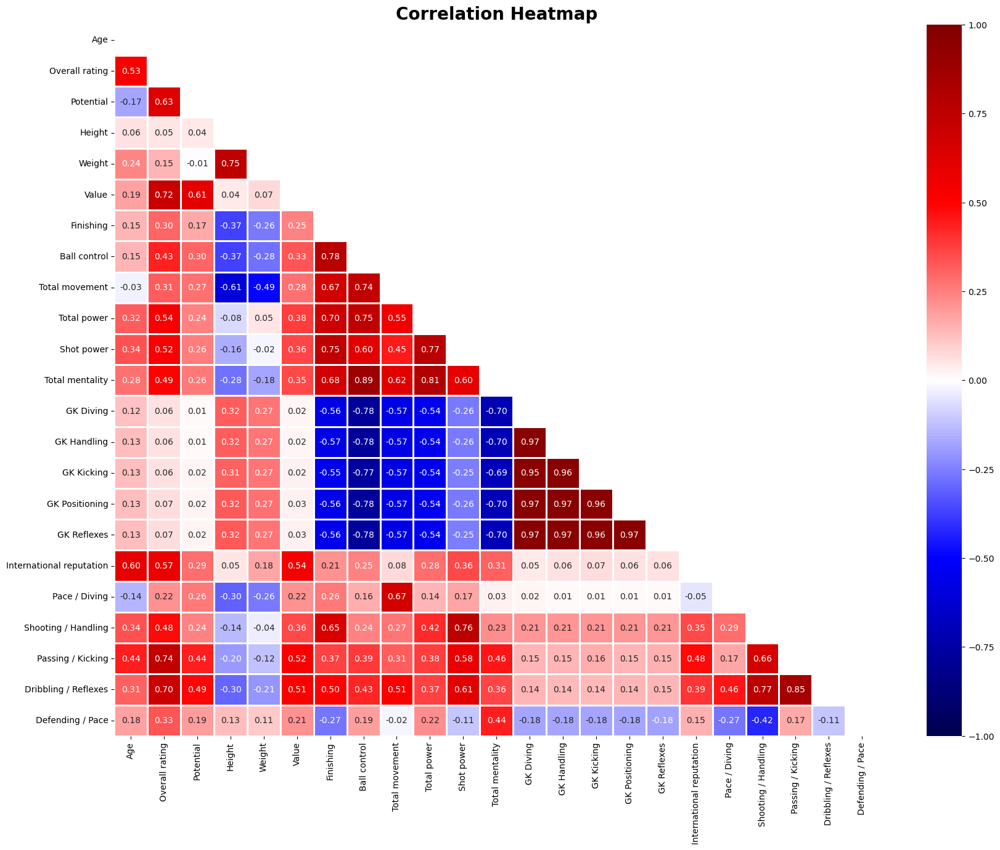

In [14]:
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
#plt.savefig('heatmap1.png',transparent=True, bbox_inches='tight')

In [15]:
df = df.drop(['Height','Weight','foot_Right'],axis=1)

#['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']

Text(0.5, 1.0, 'Correlation Heatmap')

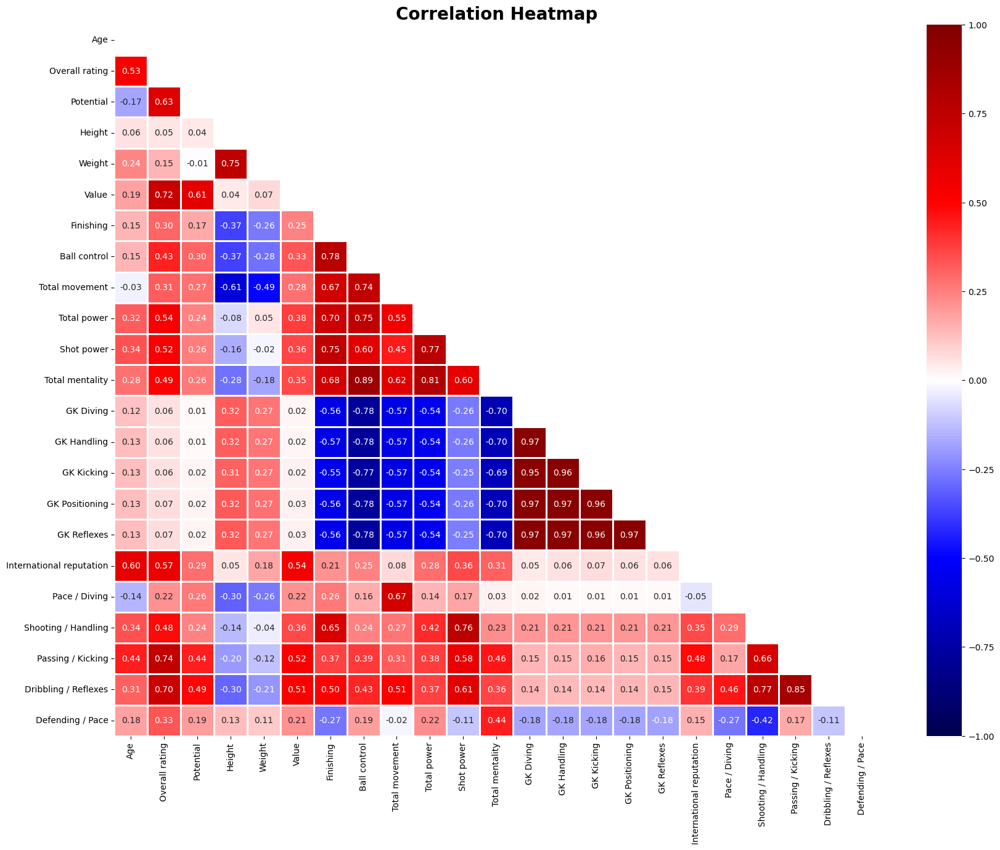

In [16]:
corr_matrix = numeric_df.corr()
fig = plt.figure(figsize=[20,15])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix,cmap='seismic',linewidth=1,linecolor='white',vmax = 1, vmin=-1,mask=mask, annot=True,fmt='0.2f')
plt.title('Correlation Heatmap', weight='bold',fontsize=20)
#plt.savefig('heatmap2.png',transparent=True, bbox_inches='tight')

Obtains a scatter plot with box plots of selected features.

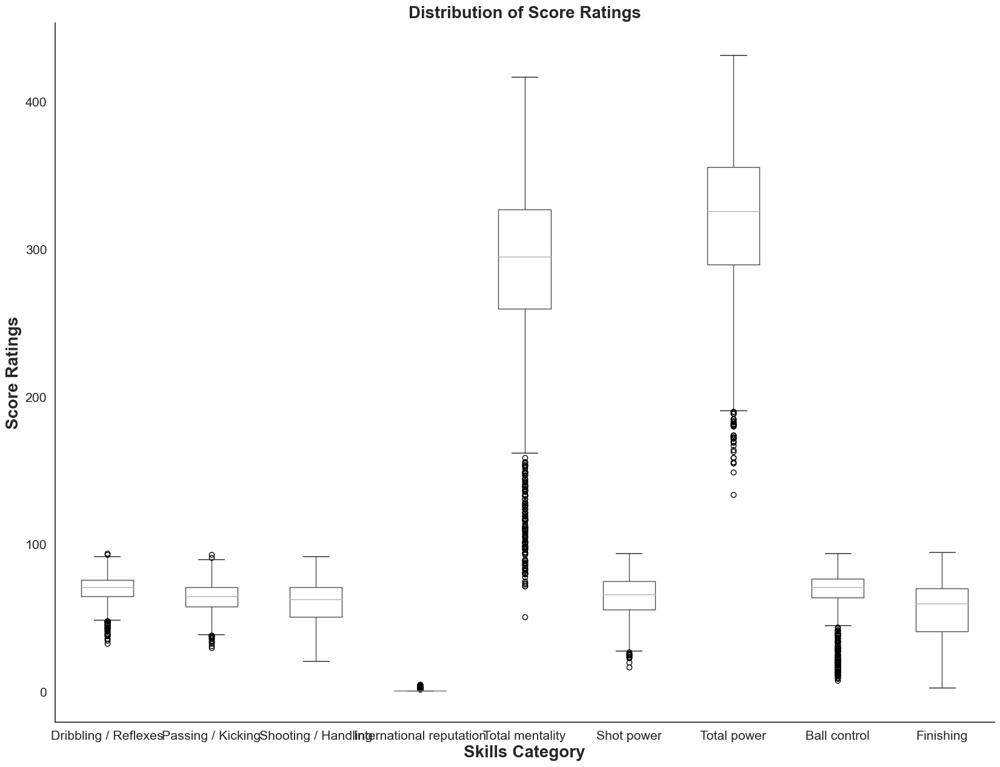

In [17]:
fig = plt.figure(figsize=[20,15])
sns.set(style='white', font_scale=1.4)
df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']].boxplot()
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')


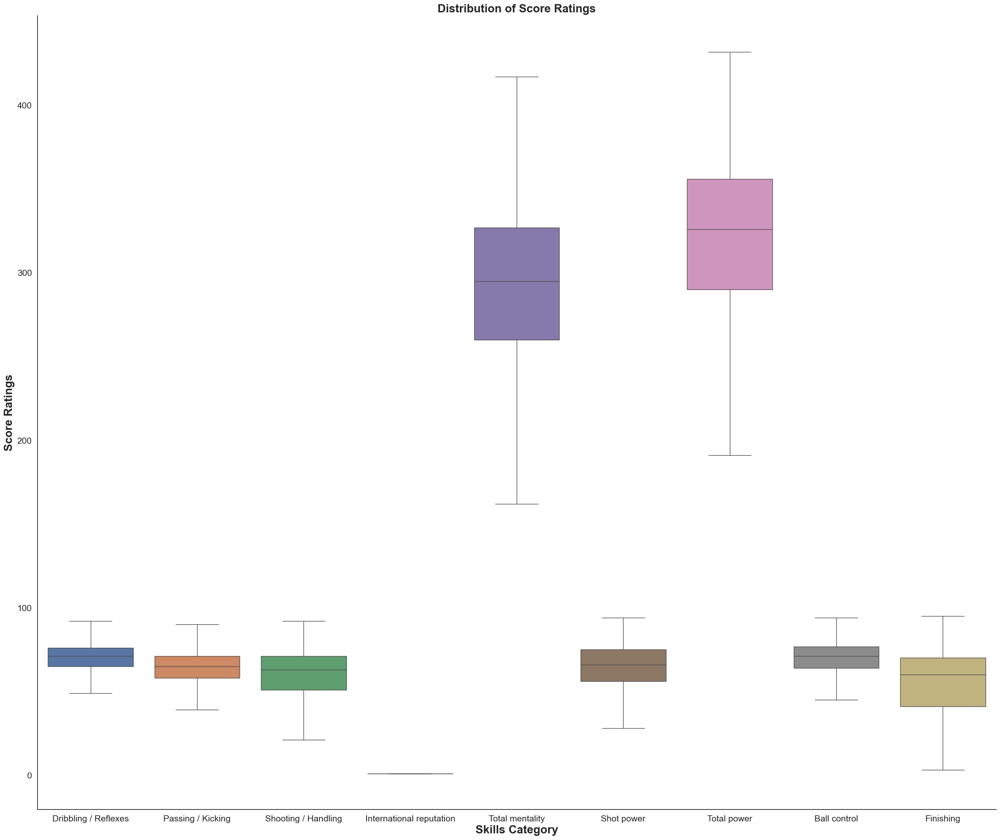

In [18]:
fig = plt.figure(figsize=[30,25])
sns.set(style='white', font_scale=1.4)
data = df[['Dribbling / Reflexes','Passing / Kicking','Shooting / Handling','International reputation','Total mentality','Shot power','Total power','Ball control','Finishing']]
sns.boxplot(data=data, showfliers=False)
plt.grid(False)
plt.xlabel('Skills Category', fontsize=20, weight='bold')
plt.ylabel('Score Ratings', fontsize=20, weight='bold')
plt.title('Distribution of Score Ratings', fontsize=20, weight='bold')
sns.despine()
# plt.savefig('boxplot.png', transparent=True, bbox_inches='tight')


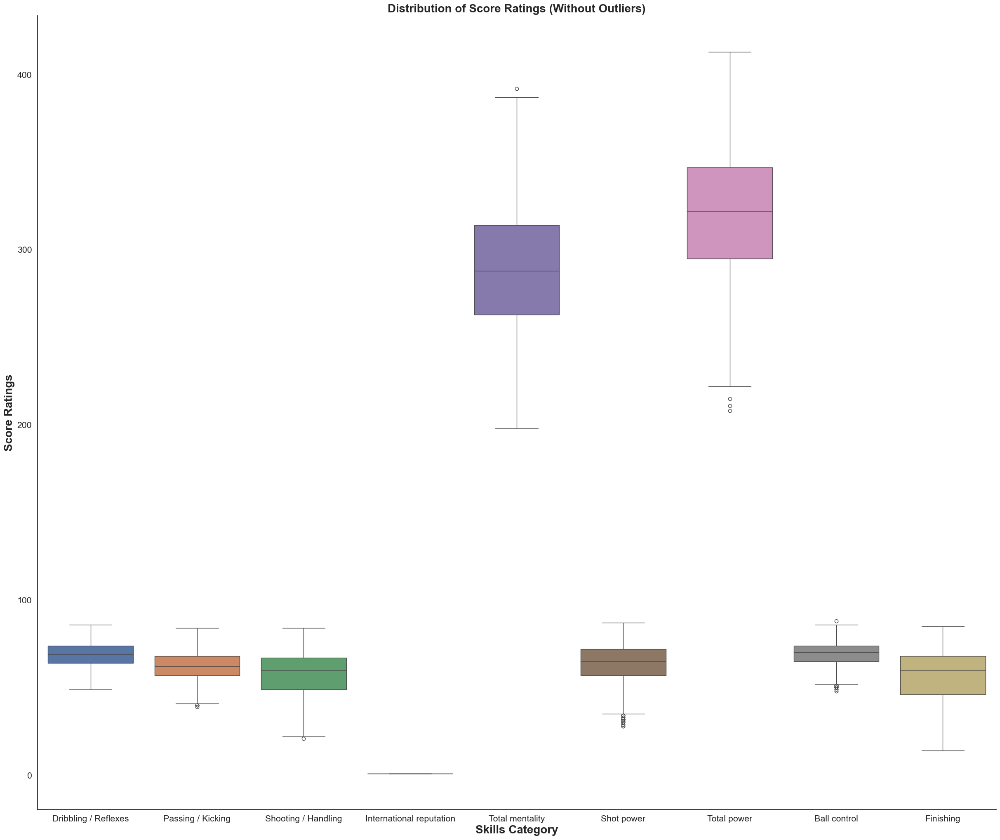

In [19]:

import numpy as np  
# Filter the DataFrame to include only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate the IQR for each column 
Q1 = numeric_df.quantile(0.25) 
Q3 = numeric_df.quantile(0.75) 
IQR = Q3 - Q1  

# Define the upper and lower bounds to identify outliers 
lower_bound = Q1 - 1.5 * IQR 
upper_bound = Q3 + 1.5 * IQR  

# Filter out the outliers from the dataset 
filtered_df = numeric_df[~((numeric_df < lower_bound) | (numeric_df > upper_bound)).any(axis=1)]  

# Create the boxplot with the filtered dataset 
fig = plt.figure(figsize=[30,25]) 
sns.set(style='white', font_scale=1.4) 
data = filtered_df[['Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing']] 
sns.boxplot(data=data) 
plt.grid(False) 
plt.xlabel('Skills Category', fontsize=20, weight='bold') 
plt.ylabel('Score Ratings', fontsize=20, weight='bold') 
plt.title('Distribution of Score Ratings (Without Outliers)', fontsize=20, weight='bold') 
sns.despine()

This code runs to generate a pairwise scatter plot showing the relationship between the variables in the data set

C:\Users\rosha\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


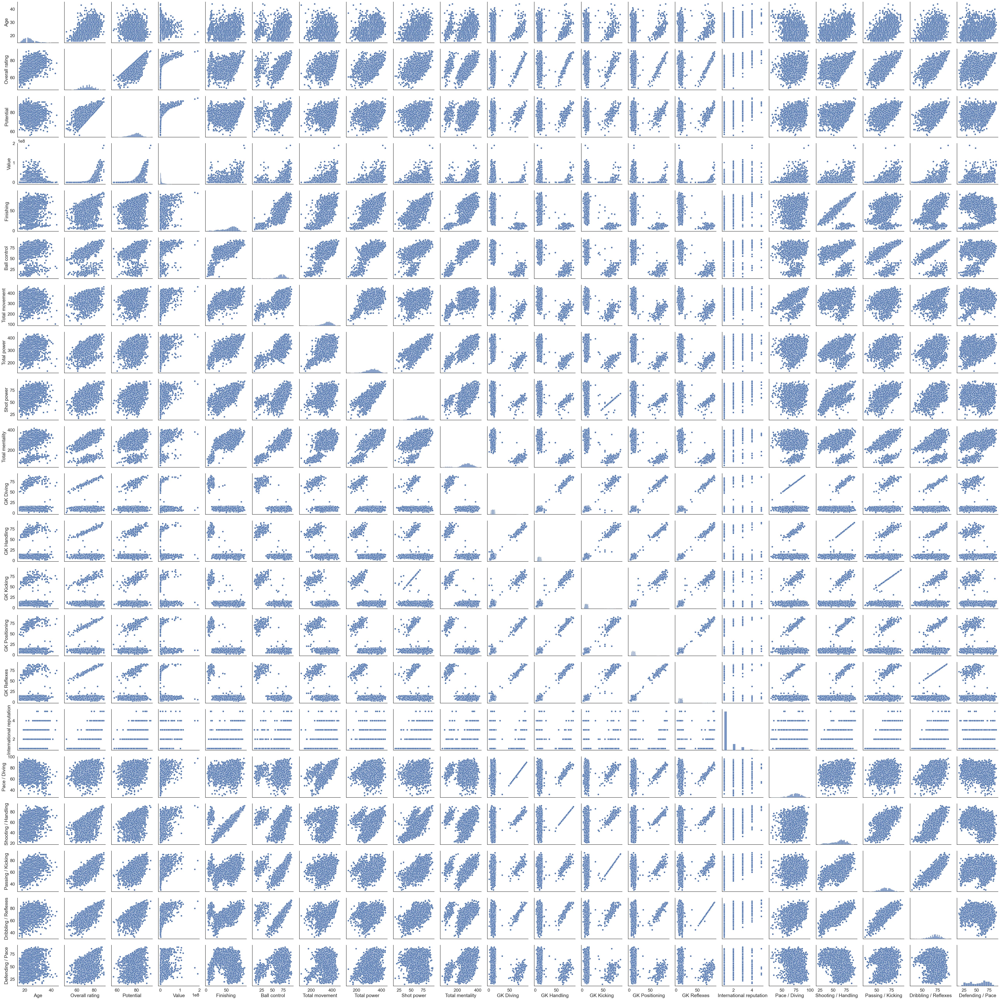

In [20]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(df)
#plt.savefig('pairplot1.png',transparent=True, bbox_inches='tight')

Selecting the features that affect the correlation the most and assigning them to the new dataset

In [21]:
selected_columns = ['name','Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Total mentality', 'Shot power', 'Total power', 'Ball control', 'Finishing','Value']
new_df = df[selected_columns].copy()



In [22]:
new_df

,name,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Value
0,J. Todibo,22,67,63,47,1,305,60,335,72,44,24500000
1,B. Verbruggen,19,76,71,70,1,99,53,218,18,8,5500000
2,M. Ugarte,21,77,71,63,1,355,62,336,77,65,26000000
3,Z. Debast,18,67,67,53,1,295,60,327,71,51,3500000
4,07 D. Last,37,60,63,55,3,74,30,134,8,32,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2697,D. Mihailovic,23,76,76,70,1,331,75,349,77,71,11500000
2698,G. Togni,24,71,65,66,1,329,73,336,70,65,2000000
2699,M. Camara,25,74,73,74,1,366,84,391,76,71,7000000
2700,S. Kaba,27,67,59,67,1,299,76,369,73,68,1500000


C:\Users\rosha\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


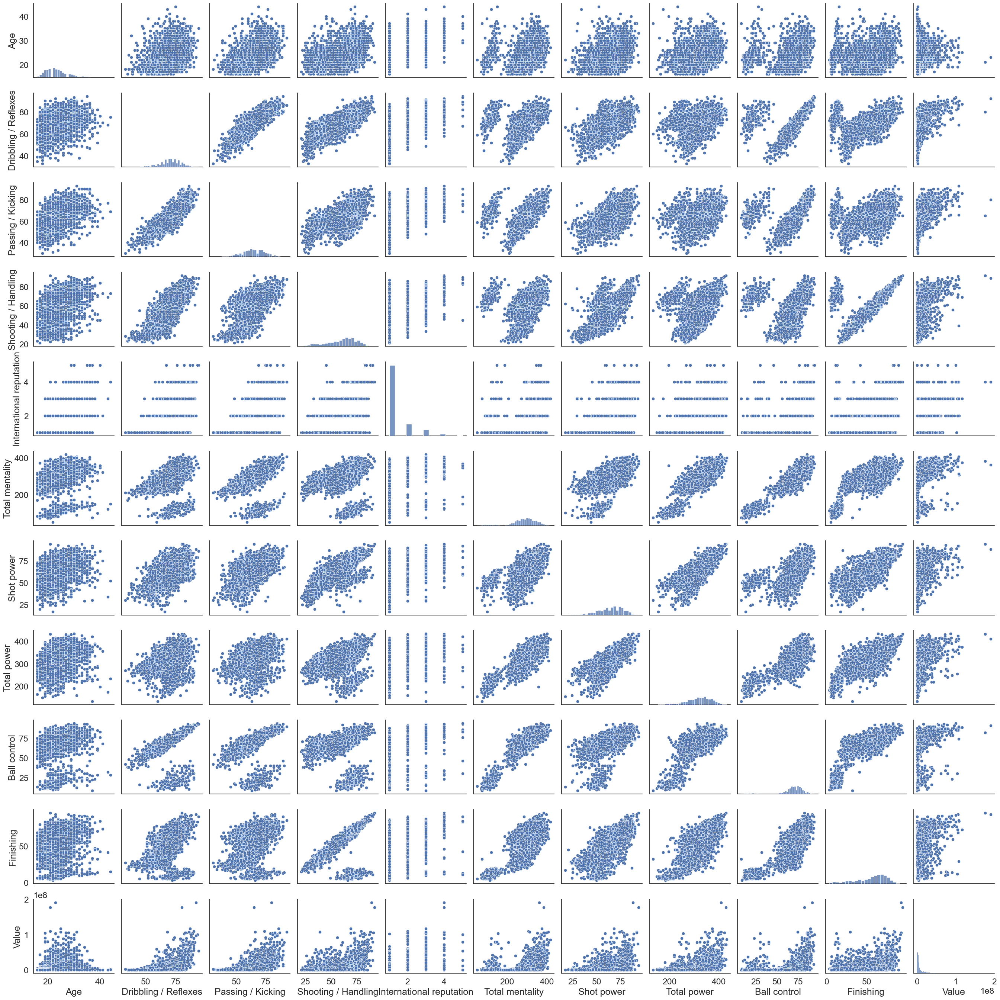

In [23]:
sns.set(style='white',font_scale=1.5)
sns.pairplot(new_df)

In [24]:


y, X = patsy.dmatrices("Q('Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=new_df, return_type="dataframe")
model = sm.OLS(y, X)
fit = model.fit()
fit.summary()



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             Q('Value')   R-squared:                       0.523
Model:                            OLS   Adj. R-squared:                  0.521
Method:                 Least Squares   F-statistic:                     295.3
Date:                Fri, 26 Jul 2024   Prob (F-statistic):               0.00
Time:                        08:28:23   Log-Likelihood:                -47675.
No. Observations:                2702   AIC:                         9.537e+04
Df Residuals:                    2691   BIC:                         9.544e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                     -5.648e+07   2.43e+06    -23.196      0.000   -6.13e+07   -5.17e+07
Q('Age')                      -1.309e+06   6.61e+04    -19.812      0.000   -1.44e+06   -1.18e+06
Q('Dribbling / Reflexes')      4.268e+05   6.91e+04      6.176      0.000    2.91e+05    5.62e+05
Q('Passing / Kicking')         1.888e+05   5.86e+04      3.219      0.001    7.38e+04    3.04e+05
Q('Shooting / Handling')       3.084e+05   7.99e+04      3.858      0.000    1.52e+05    4.65e+05
Q('International reputation')  1.167e+07   4.01e+05     29.118      0.000    1.09e+07    1.25e+07
Q('Total mentality')           2865.7922   1.08e+04      0.266      0.790   -1.83e+04     2.4e+04
Q('Shot power')                -3.44e+05   4.59e+04     -7.489      0.000   -4.34e+05   -2.54e+05
Q('Total power')               1.511e+05   1.03e+04     14.651      0.000    1.31e+05    1.71e+05
Q('Ball control')              1.823e+05   6.37e+04      2.862      0.004    5.74e+04    3.07e+05
Q('Finishing')                -3.278e+05   4.87e+04     -6.732      0.000   -4.23e+05   -2.32e+05
==============================================================================
Omnibus:                     1750.051   Durbin-Watson:                   1.602
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            42395.420
Skew:                           2.672   Prob(JB):                         0.00
Kurtosis:                      21.655   Cond. No.                     5.28e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.28e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [25]:


df1 = new_df.copy()



In [26]:
mask = new_df['Value'] > 0  # Create a boolean mask for non-zero values
df1['Value'] = np.log(new_df.loc[mask, 'Value'])  # Apply log only to non-zero values


In [27]:
df1 = df1.rename(columns={'Value':'Log Market Value'})

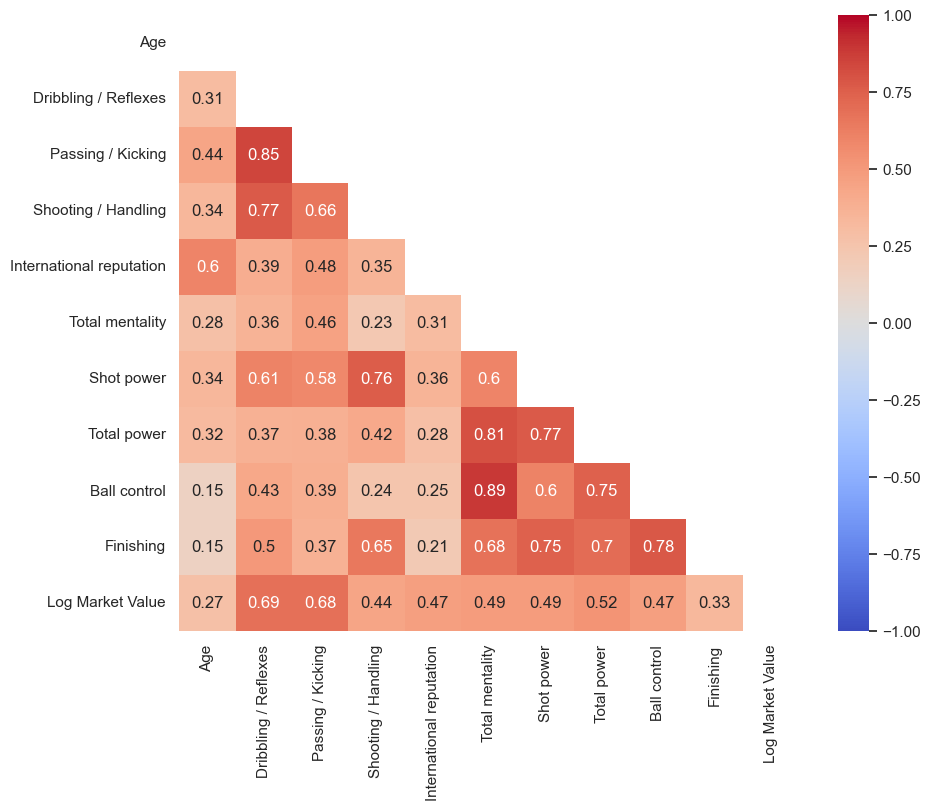

In [28]:
# Ensure all data is numeric
numeric_df = df1.select_dtypes(include=[np.number])

# Compute the correlation matrix
corr_matrix = numeric_df.corr()

# Plotting the correlation matrix
sns.set(font_scale=1, style='white')
fig = plt.figure(figsize=[10, 8])
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.show()

C:\Users\rosha\anaconda3\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


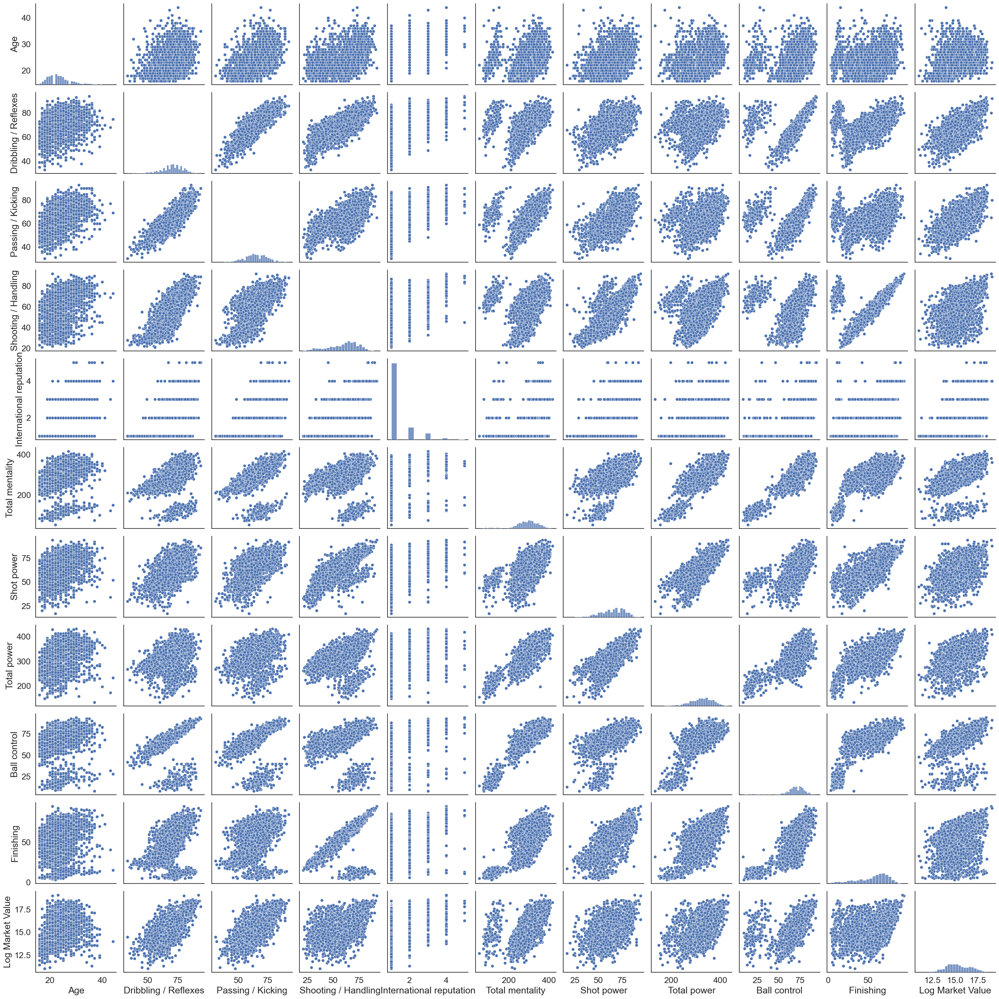

In [29]:
sns.set(style='white', font_scale=1.5)
sns.pairplot(df1)
plt.savefig('pairplot2.png', transparent=True, bbox_inches='tight')


Taking the logarithm of the market values created a normal distribution and increased the R-sq value

In [30]:
y, X = patsy.dmatrices("Q('Log Market Value') ~ Q('Age') + Q('Dribbling / Reflexes') + Q('Passing / Kicking') + Q('Shooting / Handling') + Q('International reputation') + Q('Total mentality') + Q('Shot power') + Q('Total power') + Q('Ball control') + Q('Finishing')", data=df1, return_type="dataframe")

model = sm.OLS(y, X)
fit = model.fit()
fit.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Q('Log Market Value')   R-squared:                       0.696
Model:                               OLS   Adj. R-squared:                  0.695
Method:                    Least Squares   F-statistic:                     606.0
Date:                   Fri, 26 Jul 2024   Prob (F-statistic):               0.00
Time:                           08:29:42   Log-Likelihood:                -2975.5
No. Observations:                   2656   AIC:                             5973.
Df Residuals:                       2645   BIC:                             6038.
Df Model:                             10                                         
Covariance Type:               nonrobust                                         
=================================================================================================
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept                         5.7663      0.165     34.956      0.000       5.443       6.090
Q('Age')                         -0.0681      0.005    -15.122      0.000      -0.077      -0.059
Q('Dribbling / Reflexes')         0.0623      0.005     13.370      0.000       0.053       0.071
Q('Passing / Kicking')            0.0184      0.004      4.640      0.000       0.011       0.026
Q('Shooting / Handling')          0.0312      0.005      5.749      0.000       0.021       0.042
Q('International reputation')     0.4184      0.027     15.412      0.000       0.365       0.472
Q('Total mentality')              0.0003      0.001      0.383      0.702      -0.001       0.002
Q('Shot power')                  -0.0286      0.003     -9.274      0.000      -0.035      -0.023
Q('Total power')                  0.0156      0.001     22.206      0.000       0.014       0.017
Q('Ball control')                 0.0347      0.004      7.987      0.000       0.026       0.043
Q('Finishing')                   -0.0444      0.003    -13.316      0.000      -0.051      -0.038
==============================================================================
Omnibus:                       38.187   Durbin-Watson:                   1.663
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.631
Skew:                           0.268   Prob(JB):                     1.50e-09
Kurtosis:                       3.281   Cond. No.                     5.32e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.32e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [31]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))
    
    rgr = LinearRegression()
    rgr.fit(x,y)
    pred = rgr.predict(x)

    plt.subplot(1, 3, 1)
    plt.scatter(pred,y,alpha=0.1)
    plt.plot(y, y, color='red',linewidth=1,)
    plt.title("Regression fit")
    plt.xlabel("Predicted y")
    plt.ylabel("y")
    
    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res,alpha=0.1)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")
    
    print(res)    
    
    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a 
    # specified theoretical distribution 
    stats.probplot(res, dist="norm", plot=plt,)
    plt.title("Normal Q-Q plot")

In [32]:
y = df1['Log Market Value']
X = df1.drop(['name','Log Market Value'],axis=1)

In [33]:
y

0       17.014184
1       15.520259
2       17.073607
3       15.068274
4             NaN
          ...    
2697    16.257858
2698    14.508658
2699    15.761421
2700    14.220976
2701    13.345507
Name: Log Market Value, Length: 2702, dtype: float64

0       1.396447
1       0.224155
2       0.903183
3      -0.610642
5      -0.563806
          ...   
2697    0.417963
2698   -0.501570
2699   -0.258426
2700   -0.646415
2701   -1.298432
Name: Log Market Value, Length: 2656, dtype: float64


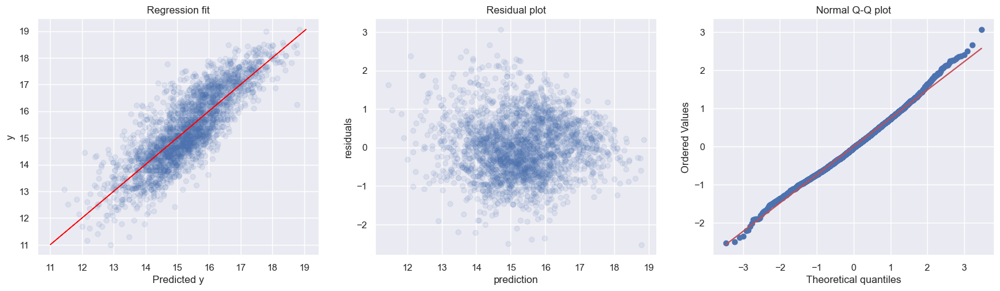

In [34]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer

# Remove rows with missing values from X and y
combined_df = pd.concat([X, y], axis=1)
combined_df.dropna(inplace=True)

# Separate X and y after removing missing values
X = combined_df.iloc[:, :-1]
y = combined_df.iloc[:, -1]

# Use the diagnostic_plot() function with the updated X and y
sns.set(style='darkgrid')
diagnostic_plot(X, y)


In [35]:
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

In [36]:
selected_columns2 = ['Age','Dribbling / Reflexes', 'Passing / Kicking', 'Shooting / Handling', 'International reputation', 'Shot power', 'Total power', 'Ball control', 'Finishing']


In [37]:
from sklearn.linear_model import LinearRegression

In [38]:
df1

,name,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing,Log Market Value
0,J. Todibo,22,67,63,47,1,305,60,335,72,44,17.014184
1,B. Verbruggen,19,76,71,70,1,99,53,218,18,8,15.520259
2,M. Ugarte,21,77,71,63,1,355,62,336,77,65,17.073607
3,Z. Debast,18,67,67,53,1,295,60,327,71,51,15.068274
4,07 D. Last,37,60,63,55,3,74,30,134,8,32,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
2697,D. Mihailovic,23,76,76,70,1,331,75,349,77,71,16.257858
2698,G. Togni,24,71,65,66,1,329,73,336,70,65,14.508658
2699,M. Camara,25,74,73,74,1,366,84,391,76,71,15.761421
2700,S. Kaba,27,67,59,67,1,299,76,369,73,68,14.220976


In [39]:
df1.isna().sum()

name                         0
Age                          0
Dribbling / Reflexes         0
Passing / Kicking            0
Shooting / Handling          0
International reputation     0
Total mentality              0
Shot power                   0
Total power                  0
Ball control                 0
Finishing                    0
Log Market Value            46
dtype: int64

In [40]:
df1 = df1.dropna()

In [41]:
df1.isna().sum()

name                        0
Age                         0
Dribbling / Reflexes        0
Passing / Kicking           0
Shooting / Handling         0
International reputation    0
Total mentality             0
Shot power                  0
Total power                 0
Ball control                0
Finishing                   0
Log Market Value            0
dtype: int64

In [42]:
X_train = df1.drop(['name', 'Log Market Value'], axis=1)
y_train = df1['Log Market Value']
reg = LinearRegression()
reg.fit(X_train, y_train)

LinearRegression()

In [43]:
model = reg.fit(X,y)

In [44]:
model.intercept_

5.7662912916092885

In [45]:
model.coef_

array([-6.81489648e-02,  6.23469638e-02,  1.84345146e-02,  3.12264893e-02,
        4.18442200e-01,  2.79180750e-04, -2.86286267e-02,  1.55685585e-02,
        3.46522361e-02, -4.43601416e-02])

In [46]:
reg.score(X_train, y_train)

0.6961605757029469

In [47]:
from sklearn.ensemble import RandomForestRegressor


In [48]:
forest = RandomForestRegressor()

forest.fit(X_train, y_train)

RandomForestRegressor()

In [49]:
forest.score(X_train, y_train)

0.9764163326705121

making dataframe


In [50]:
forest.predict(X_test)

array([16.6905341 , 15.16099102, 15.02940165, 14.06184359, 16.17271821,
       17.24257722, 14.12821489, 13.67841249, 16.09185232, 17.37253909,
       15.60022503, 16.72673877, 16.29499226, 14.98999503, 17.21241536,
       16.27739635, 16.28843583, 14.82953231, 14.12461943, 15.28927055,
       15.65904188, 15.69515414, 16.93093375, 13.56477251, 13.96223419,
       15.36832219, 17.6856514 , 13.67561249, 13.69918402, 17.21896871,
       15.1236388 , 14.01939661, 13.86006557, 15.49646873, 14.30258923,
       16.85547046, 14.97377067, 15.06411353, 14.12118679, 15.9728914 ,
       15.74318525, 16.13135531, 17.18870842, 15.62188028, 13.72194362,
       13.03830942, 16.93774288, 14.4890984 , 17.73892796, 15.57571902,
       14.47368009, 14.92527183, 14.70940319, 16.03338327, 17.13332404,
       17.51583263, 14.76664293, 13.99508054, 15.43996932, 14.53903137,
       14.26652222, 13.01850467, 16.70538587, 14.6639001 , 17.97450606,
       15.73734206, 17.09563197, 14.84933374, 16.0777609 , 15.38

In [51]:
np.array([y_test
         ])

array([[16.73328129, 15.20180492, 15.0964444 , 14.07787482, 16.01273514,
        17.28124646, 13.99783211, 13.81551056, 16.55635058, 17.23323724,
        15.68731273, 16.70588232, 16.55635058, 14.94691267, 17.16541465,
        16.16688582, 16.11809565, 14.5574479 , 14.28551419, 15.00943303,
        15.95557672, 16.01273514, 17.09265529, 13.56061831, 14.5574479 ,
        15.40474576, 17.65496287, 13.59236701, 13.65299163, 17.19990082,
        15.0964444 , 13.91082074, 13.91082074, 15.03928599, 14.28551419,
        16.83593544, 14.60396792, 15.15051162, 13.99783211, 16.01273514,
        15.52025865, 16.3412392 , 17.23323724, 15.25059508, 13.21767356,
        13.01700286, 17.01418368, 14.45736444, 17.96655046, 15.60727003,
        14.22097567, 14.73180129, 14.73180129, 15.95557672, 17.09265529,
        17.98217578, 14.73180129, 13.99783211, 15.68731273, 14.34613881,
        14.22097567, 12.34583459, 16.67771144, 14.64841968, 18.22830885,
        15.95557672, 16.99356439, 14.5574479 , 16.3

In [52]:
X_test.head()

,Age,Dribbling / Reflexes,Passing / Kicking,Shooting / Handling,International reputation,Total mentality,Shot power,Total power,Ball control,Finishing
841,27,74,67,53,1,333,60,357,75,50
125,20,74,73,68,1,108,55,205,20,5
1605,22,67,66,48,1,295,57,298,70,44
1636,19,54,49,31,1,241,41,266,57,28
709,23,70,74,67,1,359,84,388,75,58


In [53]:
reg.predict(X_test)

array([16.16263876, 15.02292591, 15.14201961, 13.8957905 , 16.19997506,
       17.02189038, 14.93375985, 14.01580088, 15.40962274, 18.16154335,
       15.58719489, 16.3410447 , 15.581331  , 14.98101621, 16.43370683,
       16.66781806, 15.93054516, 15.35988816, 14.58480338, 16.12698832,
       15.9818546 , 15.16279288, 16.60047766, 13.65565589, 12.81594196,
       14.78995795, 17.77745073, 14.51223204, 14.81106195, 17.21086905,
       15.60659093, 14.32647928, 13.71484547, 15.91904159, 14.19083176,
       16.49790017, 15.65144459, 15.34306033, 15.09005475, 16.24562278,
       16.08331555, 15.35602516, 17.15338037, 16.26550556, 14.37096337,
       13.48450059, 16.00732395, 13.82063274, 17.9813883 , 15.71560867,
       15.58934369, 15.74582159, 14.48465992, 15.1786761 , 16.77703246,
       16.527759  , 15.18583722, 14.7242828 , 14.05662498, 15.43928436,
       13.78324892, 13.70849163, 16.32272974, 15.00491403, 16.81486979,
       15.87118202, 16.89265636, 16.25465524, 16.22615625, 15.91

In [54]:
y_test

841     16.733281
125     15.201805
1605    15.096444
1636    14.077875
709     16.012735
          ...    
2561    15.226498
1684    16.972511
868     16.257858
1166    14.508658
2151    14.880221
Name: Log Market Value, Length: 532, dtype: float64

In [55]:
np.array([y_test])

array([[16.73328129, 15.20180492, 15.0964444 , 14.07787482, 16.01273514,
        17.28124646, 13.99783211, 13.81551056, 16.55635058, 17.23323724,
        15.68731273, 16.70588232, 16.55635058, 14.94691267, 17.16541465,
        16.16688582, 16.11809565, 14.5574479 , 14.28551419, 15.00943303,
        15.95557672, 16.01273514, 17.09265529, 13.56061831, 14.5574479 ,
        15.40474576, 17.65496287, 13.59236701, 13.65299163, 17.19990082,
        15.0964444 , 13.91082074, 13.91082074, 15.03928599, 14.28551419,
        16.83593544, 14.60396792, 15.15051162, 13.99783211, 16.01273514,
        15.52025865, 16.3412392 , 17.23323724, 15.25059508, 13.21767356,
        13.01700286, 17.01418368, 14.45736444, 17.96655046, 15.60727003,
        14.22097567, 14.73180129, 14.73180129, 15.95557672, 17.09265529,
        17.98217578, 14.73180129, 13.99783211, 15.68731273, 14.34613881,
        14.22097567, 12.34583459, 16.67771144, 14.64841968, 18.22830885,
        15.95557672, 16.99356439, 14.5574479 , 16.3

After training model and obtaining predictions on the testing dataset

In [56]:

predictions_forest = forest.predict(X_test)
predictions_reg = reg.predict(X_test)
# Create a new DataFrame for predictions and actual values
results_df = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest,
                           'Predicted Market Value (Linear Regression)': predictions_reg,
                           'Actual Market Value': y_test})



In [57]:
results_df

,Predicted Market Value (Random Forest),Predicted Market Value (Linear Regression),Actual Market Value
841,16.690534,16.162639,16.733281
125,15.160991,15.022926,15.201805
1605,15.029402,15.142020,15.096444
1636,14.061844,13.895791,14.077875
709,16.172718,16.199975,16.012735
...,...,...,...
2561,15.260964,15.368794,15.226498
1684,16.838088,15.603427,16.972511
868,16.153336,15.743486,16.257858
1166,14.375595,13.817534,14.508658


In [58]:
from sklearn import metrics

In [59]:
mean_sq_err_forest = metrics.mean_squared_error(y_test, predictions_forest)

In [60]:
RMSE_forest = np.sqrt(mean_sq_err_forest)

In [61]:
mean_sq_err_reg = metrics.mean_squared_error(y_test, predictions_reg)

In [62]:
RMSE_reg = np.sqrt(mean_sq_err_reg)
RMSE_reg

0.7460570074087104

In [63]:
RMSE_forest

0.21241778355129198

RMSE_forest < RMSE_reg it means random forest prediction is more accurate.

# Test prediction part

In [64]:
X_train = df1.drop(['name', 'Log Market Value'], axis=1)
y_train = df1['Log Market Value']
forest.fit(X_train, y_train)


RandomForestRegressor()

In [65]:
forest.score(X_train, y_train)

0.9764292751651326

In [66]:
forest.predict(X_train)

array([16.54201577, 15.52017713, 16.8264524 , ..., 15.95371503,
       14.36763635, 13.68096124])

In [67]:

predictions_forest_train = forest.predict(X_train)

results_df_train = pd.DataFrame({'Predicted Market Value (Random Forest)': predictions_forest_train,
                        
                           'Actual Market Value': y_train})

In [68]:
results_df_train

,Predicted Market Value (Random Forest),Actual Market Value
0,16.542016,17.014184
1,15.520177,15.520259
2,16.826452,17.073607
3,14.987172,15.068274
5,17.570104,17.776324
...,...,...
2697,16.215843,16.257858
2698,14.624802,14.508658
2699,15.953715,15.761421
2700,14.367636,14.220976


In [69]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import cross_val_score

# Create a Random Forest regressor
rf = RandomForestRegressor()

# Perform cross-validation
rf_score = cross_val_score(rf, X, y, cv=10, scoring='r2').mean()


In [70]:
rf_score

0.6927518455201033

In [71]:
rf.fit(X,y)

RandomForestRegressor()

In [72]:
from sklearn.model_selection import train_test_split

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# X_train: Training features
# y_train: Training labels
# X_val: Validation features
# y_val: Validation labels


In [73]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

# Create a Random Forest regressor
rf = RandomForestRegressor()

# Define the hyperparameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 5, 10],
    'min_samples_split': [2, 5, 10]
}

# Create the GridSearchCV object
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, scoring='r2', cv=5)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Access the best model
best_model = grid_search.best_estimator_

# Evaluate the best model
best_model_score = best_model.score(X_val, y_val)
print("Best Model Score:", best_model_score)

# Make predictions using the best model
predictions = best_model.predict(X_test)


Best Model Score: 0.8229667317409401


In [74]:
from sklearn.metrics import mean_squared_error

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)


Mean Squared Error: 0.33522479095421176


In [75]:
from sklearn.metrics import mean_squared_error, r2_score

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Evaluate the predictions using mean squared error
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

# Evaluate the predictions using R^2 score
r2 = r2_score(y_test, y_pred)
print("R^2 Score:", r2)


Mean Squared Error: 0.33522479095421176
R^2 Score: 0.8229667317409401


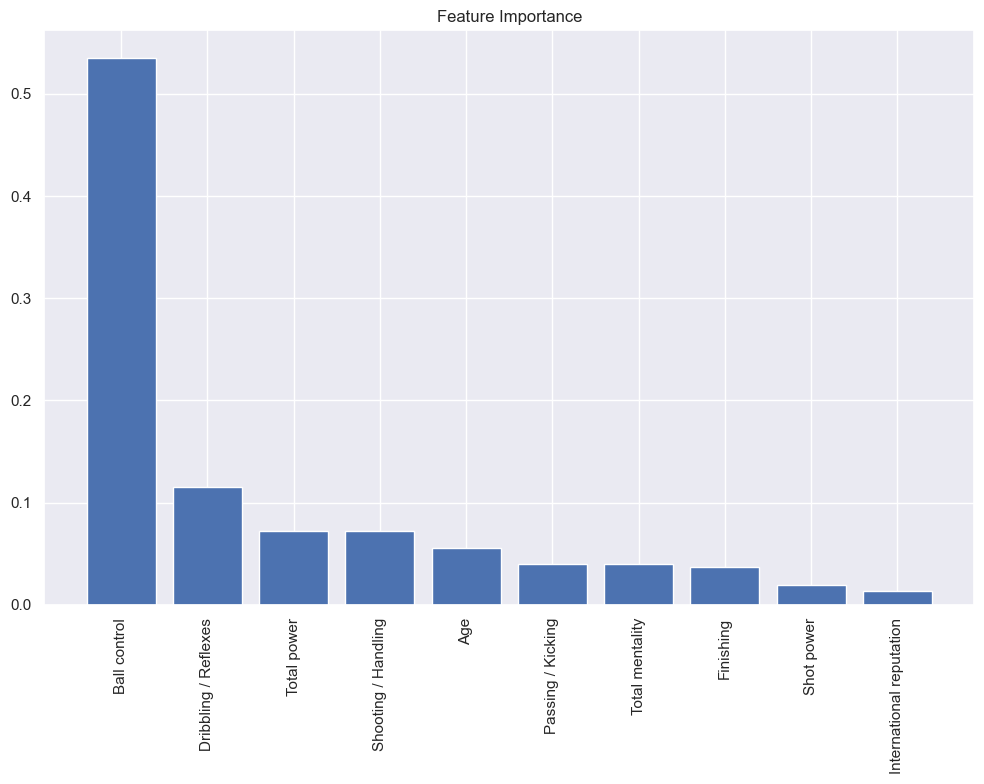

In [79]:
import matplotlib.pyplot as plt

# Get feature importances
importances = best_model.feature_importances_

# Sort feature importances in descending order
indices = np.argsort(importances)[::-1]

# Plot feature importances
plt.figure(figsize=(10, 8))
plt.title("Feature Importance")
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X_train.columns[indices], rotation=90)
plt.tight_layout()
plt.show()
#plt.savefig('feature_importances.png', transparent=True, bbox_inches='tight')

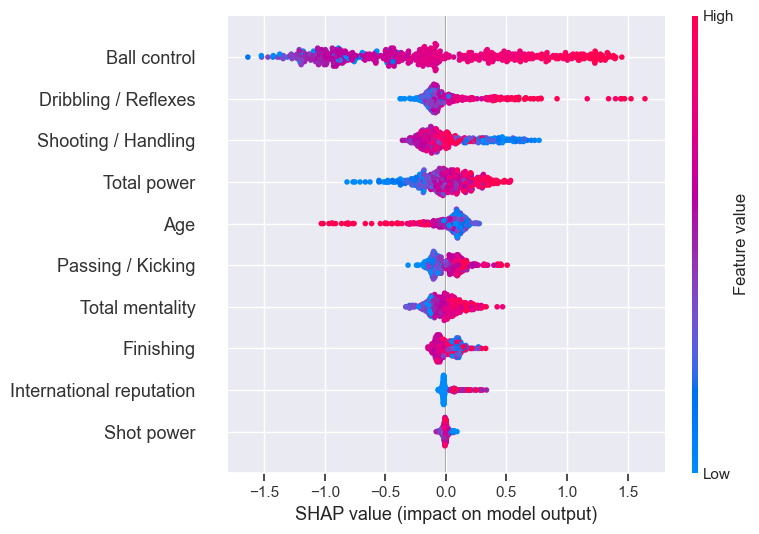

In [80]:
import shap

# Initialize a SHAP explainer
explainer = shap.Explainer(best_model)

# Calculate SHAP values for a set of instances
shap_values = explainer.shap_values(X_test)

# Visualize SHAP values with a summary plot
shap.summary_plot(shap_values, X_test)


In [81]:
import pandas as pd

# Create a DataFrame with real and predicted market values
results = pd.DataFrame({'Real Market Values': y_test, 'Predicted Market Values': y_pred})
print(results)


      Real Market Values  Predicted Market Values
841            16.733281                16.487217
125            15.201805                15.110179
1605           15.096444                14.973764
1636           14.077875                13.931391
709            16.012735                16.102390
...                  ...                      ...
2561           15.226498                15.298465
1684           16.972511                16.579249
868            16.257858                15.853099
1166           14.508658                14.292084
2151           14.880221                15.103408

[532 rows x 2 columns]


In [100]:
print(results.head(10))  # Print the first 10 rows


      Real Market Values  Predicted Market Values
841            16.733281                16.487217
125            15.201805                15.110179
1605           15.096444                14.973764
1636           14.077875                13.931391
709            16.012735                16.102390
657            17.281246                16.918703
2668           13.997832                14.498432
775            13.815511                13.426906
174            16.556351                15.338155
465            17.233237                17.583458


"""
name                        0
Age                         0
Dribbling / Reflexes        0
Passing / Kicking           0
Shooting / Handling         0
International reputation    0
Total mentality             0
Shot power                  0
Total power                 0
Ball control                0
Finishing                   0
Log Market Value            0
"""

In [101]:
index_value = 61
feature_values = df1.loc[index_value]

for column_name, value in feature_values.items():
    print(f"{column_name}: {value}")


name: K. Mbappé  
Age: 23
Dribbling / Reflexes: 92
Passing / Kicking: 80
Shooting / Handling: 89
International reputation: 4
Total mentality: 361
Shot power: 88
Total power: 410
Ball control: 91
Finishing: 93
Log Market Value: 19.06516275253103


In [102]:
input_features = [
    {'Ball control': 91, 
     'Dribbling / Reflexes': 92, 
     'Total power': 410,
    'Shooting / Handling': 89, 
     'Age': 23, 
     'Total mentality': 361,
    'Finishing': 93, 
     'Passing / Kicking': 80, 
     'Shot power': 88, 
     'International reputation': 4}
]


In [103]:
import numpy as np

input_data = pd.DataFrame(input_features)
input_array = input_data.values

# Predict log market values
log_predictions = best_model.predict(input_array)

# Reverse the logarithmic transformation to get the original market values
predicted_market_values = np.exp(log_predictions)

# Function to format the market values
def format_market_value(value):
    if value >= 1e6:
        return f"€{value / 1e6:.1f}M"
    elif value >= 1e3:
        return f"€{value / 1e3:.1f}K"
    else:
        return f"€{value:.1f}"

# Apply the formatting function to the predicted market values
formatted_predictions = [format_market_value(value) for value in predicted_market_values]

# Print the formatted predicted market values
for i, prediction in enumerate(formatted_predictions):
    print(f"Prediction : {prediction}")
    
print(f"Log value :{log_predictions}")


Prediction : €20.6M
Log value :[16.8432069]


C:\Users\rosha\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [100]:
import pickle

# Assuming 'fit' is your trained model
with open('bestmodel.pkl', 'wb') as file:
    pickle.dump(best_model, file)


In [95]:
import pickle
import numpy as np
import pandas as pd

# Load the model
with open('bestmodel.pkl', 'rb') as file:
    loaded_model = pickle.load(file)

# Define input features
input_features = [
   {
    "age": 26,
    "dribbling_reflexes": 79,
    "passing_kicking": 77,
    "shooting_handling": 78,
    "international_reputation": 2,
    "total_mentality": 354,
    "shot_power": 84,
    "total_power": 317,
    "ball_control": 77,
    "finishing": 74
}
]

# Convert to DataFrame
input_data = pd.DataFrame(input_features)
input_array = input_data.values

# Predict log market values using the loaded model
log_predictions = loaded_model.predict(input_array)

# Reverse the logarithmic transformation
predicted_market_values = np.exp(log_predictions)

# Function to format the market values
def format_market_value(value):
    if value >= 1e6:
        return f"€{value / 1e6:.1f}M"
    elif value >= 1e3:
        return f"€{value / 1e3:.1f}K"
    else:
        return f"€{value:.1f}"

# Apply the formatting function to the predicted market values
formatted_predictions = [format_market_value(value) for value in predicted_market_values]

# Print the formatted predicted market values
for i, prediction in enumerate(formatted_predictions):
    print(f"Prediction : {prediction}")


Prediction : €5.7M


C:\Users\rosha\anaconda3\Lib\site-packages\sklearn\base.py:464: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
